In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [ ]:
import pandas as pd
import selene_sdk

import pandas as pd
mtsses  = pd.read_table('./resources/mouse.tss.sortedby_fantomcage.mm10.tsv', sep='\t')

mm10 = selene_sdk.sequences.Genome(
                        input_path='./resources/mm10.fa',
                )

In [ ]:
import pyBigWig
import tabix
from selene_sdk.targets import Target
import numpy as np

class GenomicSignalFeatures(Target):
    """
    #Accept a list of cooler files as input.
    """
    def __init__(self, input_paths, features, shape, blacklists=None, blacklists_indices=None, 
        replacement_indices=None, replacement_scaling_factors=None):
        """
        Constructs a new `GenomicFeatures` object.
        """
        self.input_paths = input_paths
        self.initialized = False
        self.blacklists = blacklists
        self.blacklists_indices = blacklists_indices
        self.replacement_indices = replacement_indices
        self.replacement_scaling_factors = replacement_scaling_factors

            
        self.n_features = len(features)
        self.feature_index_dict = dict(
            [(feat, index) for index, feat in enumerate(features)])
        self.shape = (len(input_paths), *shape)

    def get_feature_data(self, chrom, start, end, nan_as_zero=True, feature_indices=None):
        if not self.initialized:
            self.data = [pyBigWig.open(path) for path in self.input_paths]
            if self.blacklists is not None:
                self.blacklists = [tabix.open(blacklist)  for blacklist in self.blacklists]
            self.initialized=True

        if feature_indices is None:
            feature_indices = np.arange(len(self.data))

        wigmat = np.zeros((len(feature_indices), end - start), dtype=np.float32)
        for i in feature_indices:
            try:
                wigmat[i, :] = self.data[i].values(chrom, start, end, numpy=True)
            except:
                print(chrom, start, end, self.input_paths[i], flush=True)
                raise
        
        if self.blacklists is not None:
            if self.replacement_indices is None:
                if self.blacklists_indices is not None:
                    for blacklist, blacklist_indices in zip(self.blacklists, self.blacklists_indices):
                        for _, s, e in blacklist.query(chrom, start, end):
                            wigmat[blacklist_indices, np.fmax(int(s)-start,0): int(e)-start] = 0
                else:
                    for blacklist in self.blacklists:
                        for _, s, e in blacklist.query(chrom, start, end):
                            wigmat[:, np.fmax(int(s)-start,0): int(e)-start] = 0
            else:
                for blacklist, blacklist_indices, replacement_indices, replacement_scaling_factor in zip(self.blacklists, self.blacklists_indices, self.replacement_indices, self.replacement_scaling_factors):
                    for _, s, e in blacklist.query(chrom, start, end):
                        wigmat[blacklist_indices, np.fmax(int(s)-start,0): int(e)-start] = wigmat[replacement_indices, np.fmax(int(s)-start,0): int(e)-start] * replacement_scaling_factor

        if nan_as_zero:
            wigmat[np.isnan(wigmat)]=0
        return wigmat


yy1aidf = GenomicSignalFeatures(["./resources/hsieh_2022_mnetseq/GSM5402685_YY1_CTRL1.f3unique_woIPriSnrpos.bin10.bw",
                                      "./resources/hsieh_2022_mnetseq/GSM5402686_YY1_CTRL2.f3unique_woIPriSnrpos.bin10.bw",
                                      "./resources/hsieh_2022_mnetseq/GSM5402687_YY1_AID1.f3unique_woIPriSnrpos.bin10.bw",
                                      "./resources/hsieh_2022_mnetseq/GSM5402688_YY1_AID2.f3unique_woIPriSnrpos.bin10.bw",
                                      "./resources/hsieh_2022_mnetseq/GSM5402688_YY1_AID2.f3unique_woIPriSnr-.bin10.bw",
                                      "./resources/hsieh_2022_mnetseq/GSM5402687_YY1_AID1.f3unique_woIPriSnr-.bin10.bw",
                                      "./resources/hsieh_2022_mnetseq/GSM5402686_YY1_CTRL2.f3unique_woIPriSnr-.bin10.bw",
                                      "./resources/hsieh_2022_mnetseq/GSM5402685_YY1_CTRL1.f3unique_woIPriSnr-.bin10.bw"],
                               ['control1+','control2+','yy1aid1+','yy1aid2+','yy1aid2-','yy1aid1-','control2-','control1-'],
                               (2000,))


nfyf = GenomicSignalFeatures(["./resources/oldfield_2019_NFYstartseq/GSE115110_Control-KD_mean_5pr_startRNA_spikeNorm_plus.bedgraph.fixed.mm10.sorted.bw",
                             "./resources/oldfield_2019_NFYstartseq/GSE115110_NFY-KD_mean_5pr_startRNA_spikeNorm_plus.bedgraph.fixed.mm10.sorted.bw",
                              "./resources/oldfield_2019_NFYstartseq/GSE115110_NFY-KD_mean_5pr_startRNA_spikeNorm_minus.bedgraph.fixed.mm10.sorted.bw",
                              "./resources/oldfield_2019_NFYstartseq/GSE115110_Control-KD_mean_5pr_startRNA_spikeNorm_minus.bedgraph.fixed.mm10.sorted.bw",],
                               ['control+','nfykd+','nfykd-','control1-'],
                               (2000,))


In [ ]:
half_window_p = 1000
mtss_targets=[]
for tssi in range(40000):
    chrm, pos, strand = mtsses['chr'][tssi], mtsses['pos'][tssi], mtsses['strand'][tssi]
    offset = 1 if strand == '-' else 0

    target = yy1aidf.get_feature_data(chrm, pos-half_window_p+offset, pos+half_window_p+offset)
    if strand == '-':
       target = target[::-1, ::-1].copy()
    mtss_targets.append(target[None,:,:])
import numpy as np
yy1data = np.concatenate(mtss_targets)


In [ ]:
half_window_p = 1000
mtss_targets=[]
for tssi in range(40000):
    chrm, pos, strand = mtsses['chr'][tssi], mtsses['pos'][tssi], mtsses['strand'][tssi]
    offset = 1 if strand == '-' else 0

    target = nfyf.get_feature_data(chrm, pos-half_window_p+offset, pos+half_window_p+offset)
    if strand == '-':
       target = target[::-1, ::-1].copy()
    mtss_targets.append(target[None,:,:])
nfydata = np.concatenate(mtss_targets)



In [ ]:
import torch
from torch import nn
from torch.autograd import grad

from torch_fftconv import fft_conv1d, FFTConv1d
import numpy as np
from copy import deepcopy

class simpleNet(nn.Module):
    def __init__(self):

        super(simpleNet, self).__init__()
        self.conv = nn.Conv1d(4,  10, kernel_size=51, padding=25)
        self.conv_inr = nn.Conv1d(4,  10, kernel_size=15, padding=7)
        self.conv_sim = nn.Conv1d(4,  32, kernel_size=3, padding=1)

        self.activation = nn.Softplus()

        #self.deconv = nn.ConvTranspose1d(18,  10, kernel_size=601, padding=300)
        self.deconv = FFTConv1d(10*2,  10, kernel_size=601, padding=300)
        self.deconv_sim = FFTConv1d(64,  10, kernel_size=601, padding=300)
        #self.deconv_mono = nn.ConvTranspose1d(4,  10, kernel_size=401, padding=200)
        self.deconv_inr = nn.ConvTranspose1d(20,  10, kernel_size=15, padding=7)

        self.scaler = nn.Parameter(torch.ones(1))
        self.scaler2 = nn.Parameter(torch.ones(1))



    def forward(self, x, turnoff_inds=None):
        y = torch.cat([self.conv(x), self.conv(x.flip([1,2])).flip([2])], 1)
        y_sim = torch.cat([self.conv_sim(x), self.conv_sim(x.flip([1,2])).flip([2])], 1)
        y_inr = torch.cat([self.conv_inr(x), self.conv_inr(x.flip([1,2])).flip([2])], 1)
        yact = self.activation(y )
        y_sim_act = self.activation(y_sim) #* y_sim
        y_inr_act = self.activation(y_inr)
        
        if turnoff_inds is not None:
            yact[:, turnoff_inds, :] =0

        y_pred = self.activation(self.deconv(yact)+self.deconv_inr(y_inr_act)+self.deconv_sim(y_sim_act))
        return y_pred

net = simpleNet()
net.load_state_dict(torch.load('./resources/puffin.pth'), strict=False)
net.cuda()

motifnames_original=  ['SP -', 'ETS -', 'CREB -', 'NFY -', 'YY1 -', 'U1 snRNP +', 'Long Inr +', 'NRF1 +', 'ZNF143 -', 'TATA -',
                      'SP +', 'ETS +', 'CREB +', 'NFY +', 'YY1 +', 'U1 snRNP -', 'Long Inr -', 'NRF1 -', 'ZNF143 +', 'TATA +']

motifnames_original  = np.array(motifnames_original)


In [ ]:
import torch

tss_preds = []
for tssi in range(40000):
    offset = 1 if mtsses['strand'][tssi] == '-' else 0
    seq = mm10.get_encoding_from_coords(mtsses['chr'][tssi], mtsses['pos'][tssi]-825+offset, mtsses['pos'][tssi]+825+offset, mtsses['strand'][tssi]).copy()
    pred = net(torch.FloatTensor(seq)[None,:,:].transpose(1,2).cuda())
    tss_preds.append(pred.cpu().detach().numpy())
tss_preds = np.concatenate(tss_preds)


In [ ]:
import torch

tss_preds_yy1aid = []
for tssi in range(40000):
    offset = 1 if mtsses['strand'][tssi] == '-' else 0
    seq = mm10.get_encoding_from_coords(mtsses['chr'][tssi], mtsses['pos'][tssi]-825+offset, mtsses['pos'][tssi]+825+offset, mtsses['strand'][tssi]).copy()
    pred = net(torch.FloatTensor(seq)[None,:,:].transpose(1,2).cuda(), turnoff_inds = [motifnames_original.tolist().index('YY1 +'), motifnames_original.tolist().index('YY1 -')])
    tss_preds_yy1aid.append(pred.cpu().detach().numpy())

tss_preds_yy1aid = np.concatenate(tss_preds_yy1aid)


In [ ]:
import torch

tss_preds_nfykd = []
for tssi in range(40000):
    offset = 1 if mtsses['strand'][tssi] == '-' else 0
    seq = mm10.get_encoding_from_coords(mtsses['chr'][tssi], mtsses['pos'][tssi]-825+offset, mtsses['pos'][tssi]+825+offset, mtsses['strand'][tssi]).copy()
    pred = net(torch.FloatTensor(seq)[None,:,:].transpose(1,2).cuda(), turnoff_inds = [motifnames_original.tolist().index('NFY +'), motifnames_original.tolist().index('NFY -')])
    tss_preds_nfykd.append(pred.cpu().detach().numpy())
tss_preds_nfykd = np.concatenate(tss_preds_nfykd)


In [ ]:
tss_preds_yy1aid_diff =  (tss_preds_yy1aid[:,4,325:-325] - tss_preds[:,4,325:-325])
tss_preds_nfykd_diff  =  (tss_preds_nfykd[:,4,325:-325] - tss_preds[:,4,325:-325])

In [ ]:
tss_preds_yy1aid_diff_rev =  (tss_preds_yy1aid[:,-5,325:-325] - tss_preds[:,-5,325:-325])
tss_preds_nfykd_diff_rev  =  (tss_preds_nfykd[:,-5,325:-325] - tss_preds[:,-5,325:-325])


Bad key text.latex.preview in file /home2/s190483/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 123 ('text.latex.preview : False')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.5.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key mathtext.fallback_to_cm in file /home2/s190483/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 155 ('mathtext.fallback_to_cm : True  # When True, use symbols from the Computer Modern')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.5.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key savefig.jpeg_quality in file /home2/s190483/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 418 ('savefig.jpeg_quality: 95       # when a jpeg is saved, the default 

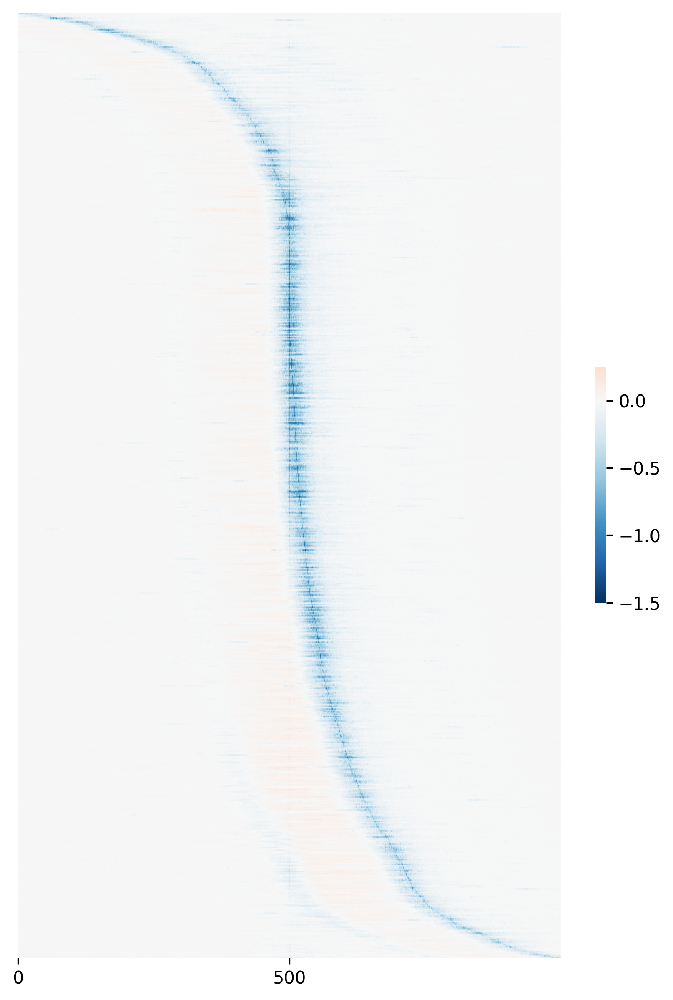

In [ ]:
from matplotlib import pyplot as plt
import seaborn
from scipy.signal import fftconvolve
%matplotlib inline
plt.figure(figsize=(7,10),dpi=300)
filteri = np.abs(tss_preds_yy1aid_diff).sum(axis=1)>20
seaborn.heatmap( fftconvolve(np.array(tss_preds_yy1aid_diff)[filteri][np.argsort(np.array(tss_preds_yy1aid_diff).argmin(axis=1)[filteri]),:],
                             np.ones((5,1))/5,mode='valid'),
                cmap='RdBu_r', center=0,xticklabels=500,yticklabels=False, 
               cbar_kws=dict(use_gridspec=False,location="right",pad=0.05,shrink=0.25),rasterized=True)
plt.savefig('./figures/experiment_yy1aid.heatmap.pred.pdf')


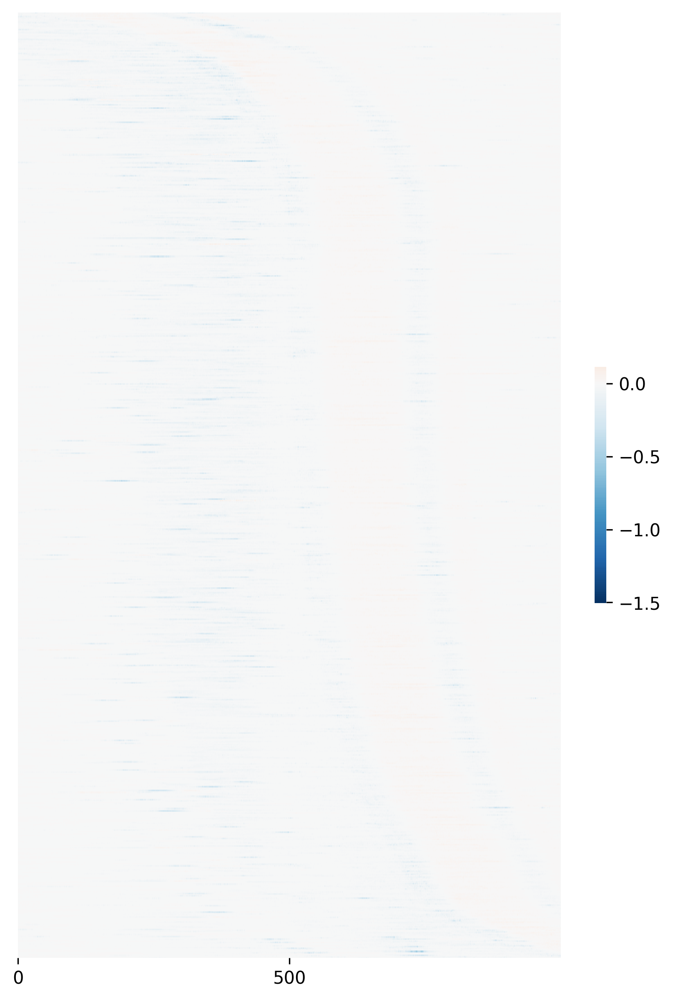

In [ ]:
from matplotlib import pyplot as plt
import seaborn
from scipy.signal import fftconvolve
%matplotlib inline
plt.figure(figsize=(7,10),dpi=300)
filteri = np.abs(tss_preds_yy1aid_diff).sum(axis=1)>20
seaborn.heatmap( fftconvolve(np.array(tss_preds_yy1aid_diff_rev)[filteri][np.argsort(np.array(tss_preds_yy1aid_diff).argmin(axis=1)[filteri]),:],
                             np.ones((5,1))/5,mode='valid'),
                cmap='RdBu_r', center=0,xticklabels=500,yticklabels=False, 
               cbar_kws=dict(use_gridspec=False,location="right",pad=0.05,shrink=0.25),rasterized=True, vmin=-1.506)
plt.savefig('./figures/experiment_yy1aid.heatmap.pred.rev.pdf')


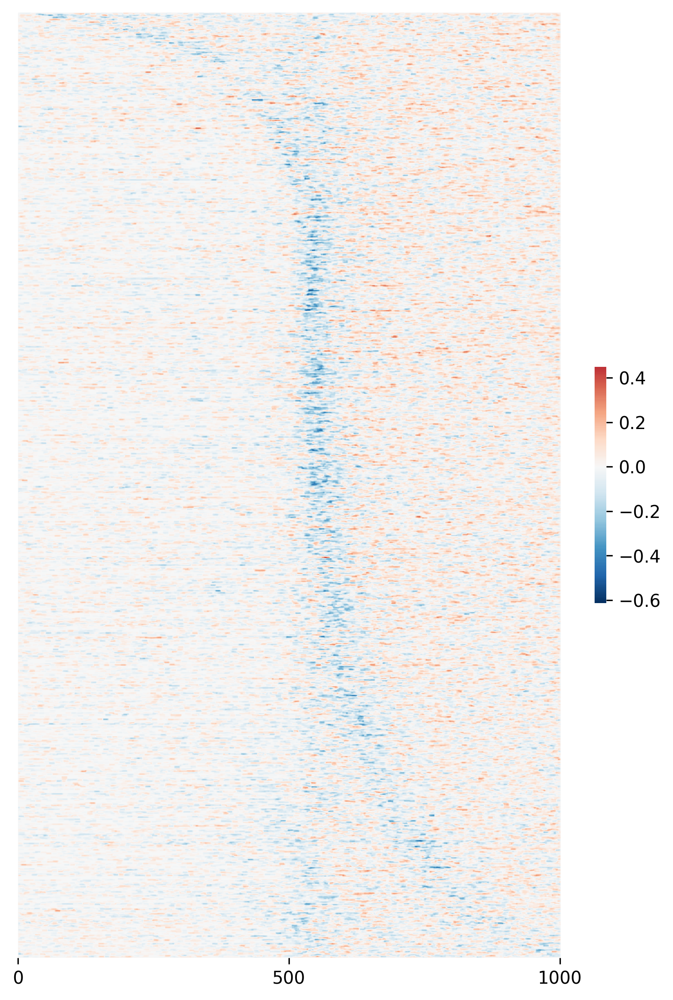

In [ ]:
plt.figure(figsize=(7,10), dpi=300)
filteri = np.abs(tss_preds_yy1aid_diff).sum(axis=1)>20

seaborn.heatmap( fftconvolve((np.log(1+yy1data[:,2:4,500:-500].sum(axis=1))-np.log(1+yy1data[:,:2,500:-500].sum(axis=1)))[filteri][np.argsort(np.array(tss_preds_yy1aid_diff).argmin(axis=1)[filteri]),:],
                             np.ones((5,3))/15), cmap='RdBu_r', center=0,xticklabels=500,yticklabels=False,
               cbar_kws=dict(use_gridspec=False,location="right",pad=0.05,shrink=0.25), rasterized=True)
plt.savefig('./figures/experiment_yy1aid.heatmap.exp.pdf')


In [ ]:
filteri = np.abs(tss_preds_yy1aid_diff).sum(axis=1)>20

centered_effects=[]
for i, pos in enumerate(np.array(tss_preds_yy1aid_diff).argmin(axis=1)):
    if filteri[i]:
        centered_effects.append(np.log(1+yy1data[i,2:4,pos:pos+1000].sum(axis=0))- \
                                np.log(1+yy1data[i,:2,pos:pos+1000].sum(axis=0)))

centered_effects_rev=[]
for i, pos in enumerate(np.array(tss_preds_yy1aid_diff).argmin(axis=1)):
    if filteri[i]:
        centered_effects_rev.append(np.log(1+yy1data[i,4:6,pos:pos+1000].sum(axis=0))- \
                                np.log(1+yy1data[i,6:,pos:pos+1000].sum(axis=0)))

In [ ]:
plt.figure(dpi=300)
plt.plot(np.mean(np.array(centered_effects),axis=0),linewidth=0.5)
plt.plot(np.mean(np.array(centered_effects_rev),axis=0),linewidth=0.5)
seaborn.despine()

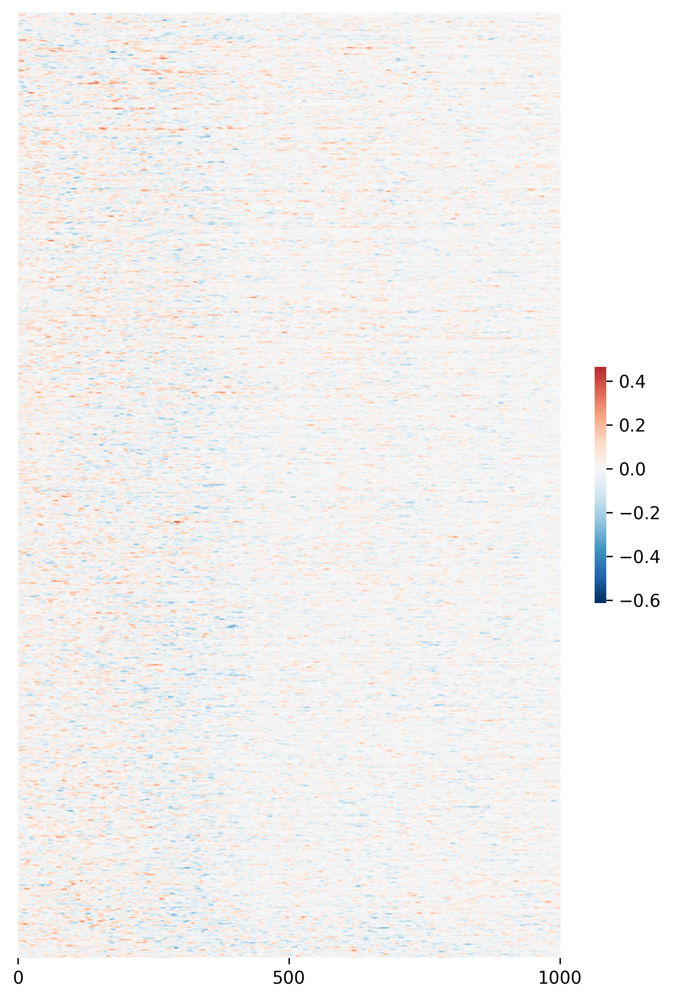

In [ ]:
plt.figure(figsize=(7,10), dpi=300)
filteri = np.abs(tss_preds_yy1aid_diff).sum(axis=1)>20
#filteri = filteri & (np.log10(1+yy1data[:,:,1000-500:1000+500].sum(axis=-1).sum(axis=-1))>1.)

seaborn.heatmap( fftconvolve((np.log(1+yy1data[:,4:6,500:-500].sum(axis=1))-np.log(1+yy1data[:,6:,500:-500].sum(axis=1)))[filteri][np.argsort(np.array(tss_preds_yy1aid_diff).argmin(axis=1)[filteri]),:],
                             np.ones((5,3))/15), cmap='RdBu_r', center=0,xticklabels=500,yticklabels=False,
               cbar_kws=dict(use_gridspec=False,location="right",pad=0.05,shrink=0.25), rasterized=True, vmin=-0.614)
plt.savefig('./figures/experiment_yy1aid.heatmap.exp.rev.pdf')


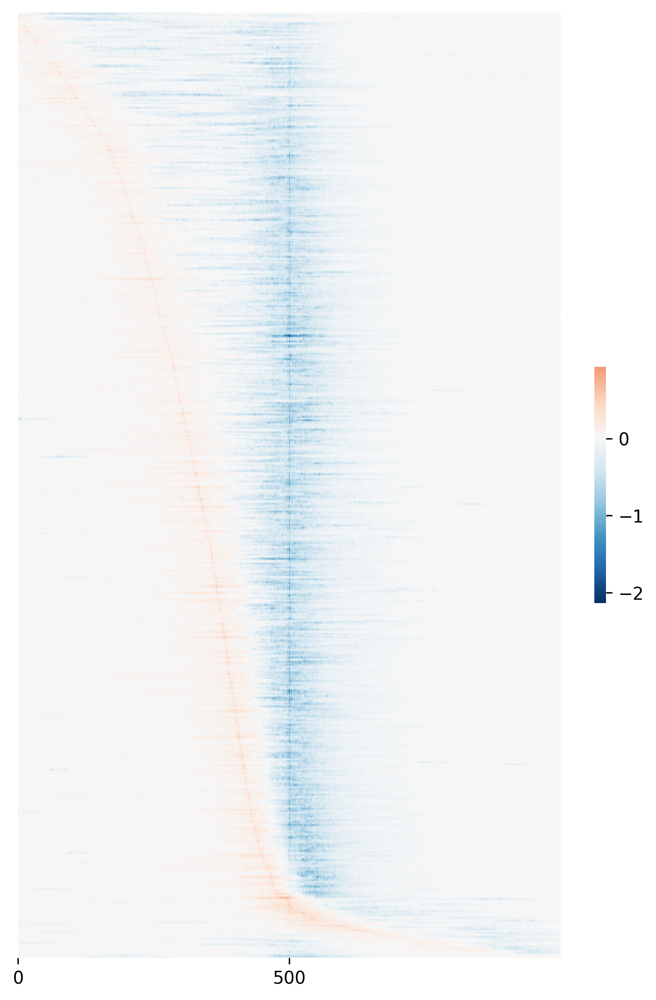

In [ ]:
plt.figure(figsize=(7,10), dpi=300)
filteri = np.abs(tss_preds_nfykd_diff).sum(axis=1)>55
seaborn.heatmap( fftconvolve(np.array(tss_preds_nfykd_diff)[filteri][np.argsort(np.array(tss_preds_nfykd_diff).argmax(axis=1)[filteri]),:],
                             np.ones((5,1))/5,mode='valid'),
                cmap='RdBu_r', center=0,xticklabels=500,yticklabels=False,
               cbar_kws=dict(use_gridspec=False,location="right",pad=0.05,shrink=0.25),rasterized=True)
plt.savefig('./figures/experiment_nfykd.heatmap.pred.pdf')


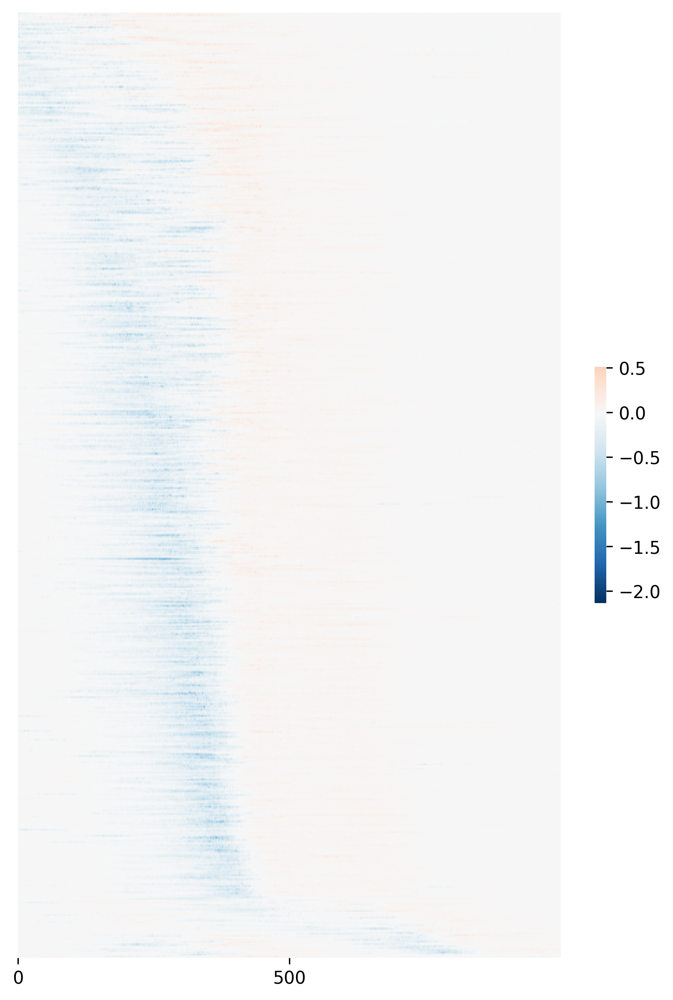

In [ ]:
plt.figure(figsize=(7,10), dpi=300)
filteri = np.abs(tss_preds_nfykd_diff).sum(axis=1)>55
seaborn.heatmap( fftconvolve(np.array(tss_preds_nfykd_diff_rev)[filteri][np.argsort(np.array(tss_preds_nfykd_diff).argmax(axis=1)[filteri]),:],
                             np.ones((5,1))/5,mode='valid'),
                cmap='RdBu_r', center=0,xticklabels=500,yticklabels=False,
               cbar_kws=dict(use_gridspec=False,location="right",pad=0.05,shrink=0.25),rasterized=True,vmin=-2.136)
plt.savefig('./figures/experiment_nfykd.heatmap.pred.rev.pdf')


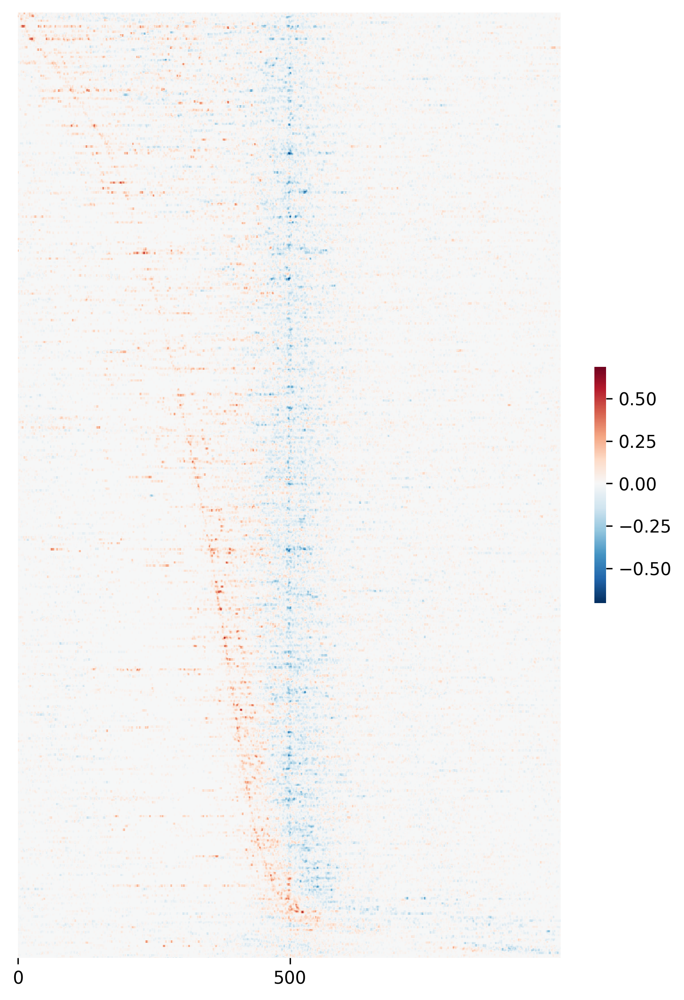

In [ ]:
plt.figure(figsize=(7,10),dpi=300)
filteri = np.abs(tss_preds_nfykd_diff).sum(axis=1)>55
seaborn.heatmap(  fftconvolve( (np.log(1+nfydata[:,1,1000-500:1000+500])-np.log(1+nfydata[:,0,1000-500:1000+500]))[filteri][np.argsort(np.array(tss_preds_nfykd_diff).argmax(axis=1)[filteri]),:],
                              np.ones((5,3))/15,mode='valid'),
                cmap='RdBu_r', center=0,xticklabels=500,yticklabels=False,
               cbar_kws=dict(use_gridspec=False,location="right",pad=0.05,shrink=0.25),rasterized=True)
plt.savefig('./figures/experiment_nfykd.heatmap.exp.pdf')


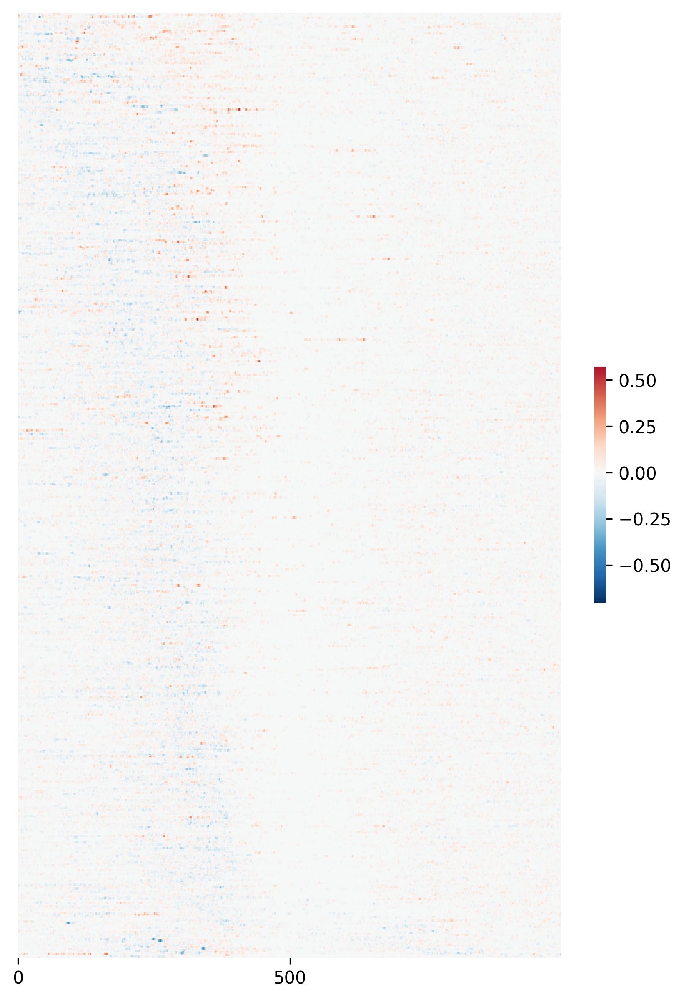

In [ ]:
plt.figure(figsize=(7,10),dpi=300)
filteri = np.abs(tss_preds_nfykd_diff).sum(axis=1)>55
seaborn.heatmap(  fftconvolve( (np.log(1+nfydata[:,-2,1000-500:1000+500])-np.log(1+nfydata[:,-1,1000-500:1000+500]))[filteri][np.argsort(np.array(tss_preds_nfykd_diff).argmax(axis=1)[filteri]),:],
                              np.ones((5,3))/15,mode='valid'),
                cmap='RdBu_r', center=0,xticklabels=500,yticklabels=False,
               cbar_kws=dict(use_gridspec=False,location="right",pad=0.05,shrink=0.25),rasterized=True, vmin=-0.7054)
plt.savefig('./figures/experiment_nfykd.heatmap.exp.rev.pdf')


In [ ]:
filteri = np.abs(tss_preds_nfykd_diff).sum(axis=1)>55
np.sum(filteri)

2030

In [ ]:
filteri = np.abs(tss_preds_nfykd_diff).sum(axis=1)>55

centered_effects=[]
for i, pos in enumerate(np.array(tss_preds_yy1aid_diff).argmin(axis=1)):
    if filteri[i]:
        centered_effects.append(np.log(1+nfydata[i,1,pos:pos+1000])-np.log(1+nfydata[i,0,pos:pos+1000]))

centered_effects_rev=[]
for i, pos in enumerate(np.array(tss_preds_yy1aid_diff).argmin(axis=1)):
    if filteri[i]:
        centered_effects_rev.append(np.log(1+nfydata[i,-2,pos:pos+1000])-np.log(1+nfydata[i,-1,pos:pos+1000]))

In [ ]:
plt.plot(np.mean(np.array(centered_effects),axis=0))
plt.plot(np.mean(np.array(centered_effects_rev),axis=0))


In [ ]:
%load_ext rpy2.ipython

In [ ]:
%%R
require(scales)
theme_Publication <- function(base_size=14, base_family="helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(1, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#f0f0f0",fill="#f0f0f0"),
               strip.text = element_text(face="bold")
          ))
      
}
scale_fill_Publication <- function(...){
      discrete_scale("fill","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}
scale_colour_Publication <- function(...){
      discrete_scale("colour","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}


R[write to console]: Loading required package: scales



In [ ]:
diffexp_yy1 = np.log(1+yy1data[:,2:4,950:1100].sum(axis=1).sum(-1)/10)- np.log(1+yy1data[:,:2,950:1100].sum(axis=1).sum(-1)/10)
diffexp_nfy = np.log(1+nfydata[:,1,1000-50:1000+50].sum(-1))- np.log(1+nfydata[:,0,1000-50:1000+50].sum(axis=-1))


R[write to console]: Saving 7 x 4 in image

R[write to console]: `stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

R[write to console]: `stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

R[write to console]: `stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

R[write to console]: `stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



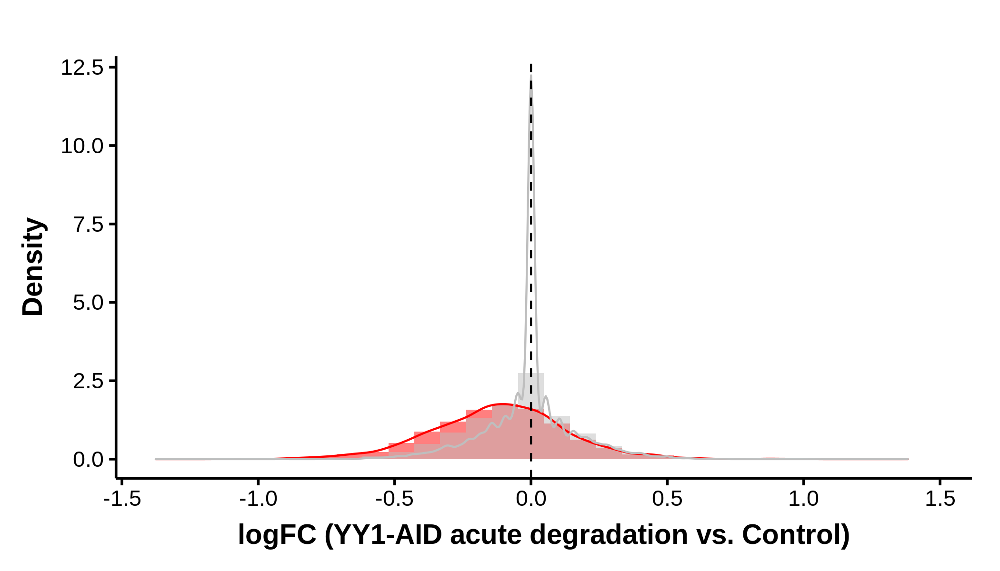

In [ ]:
%%R -i diffexp_yy1,tss_preds_yy1aid_diff -w 7 -h 4 --unit in --res 300

require(ggplot2)
p=ggplot()+
 geom_histogram(aes(diffexp_yy1[rowSums(abs(tss_preds_yy1aid_diff))>20],..density..),fill='red',alpha=0.5)+
 geom_histogram(aes(diffexp_yy1[rowSums(tss_preds_yy1aid_diff)<1],..density..),fill='gray',alpha=0.5)+
 geom_density(aes(diffexp_yy1[rowSums(abs(tss_preds_yy1aid_diff))>20],..density..),color='red')+
 geom_density(aes(diffexp_yy1[rowSums(abs(tss_preds_yy1aid_diff))<1],..density..),color='gray')+
 #geom_density(aes(diffexp[yy1contri>0.5],..density..),fill='orange',alpha=0.5)+
 #geom_density(aes(diffexp[yy1contri<0.01],..density..),fill='blue',alpha=0.5)+
 geom_vline(xintercept=0,linetype=2)+theme_Publication()+xlab('logFC (YY1-AID acute degradation vs. Control)')+ylab('Density')

ggsave('./figures/experiment_yy1aid.pdf', device=cairo_pdf)
p


R[write to console]: Saving 7 x 4 in image

R[write to console]: `stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

R[write to console]: `stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

R[write to console]: `stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

R[write to console]: `stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



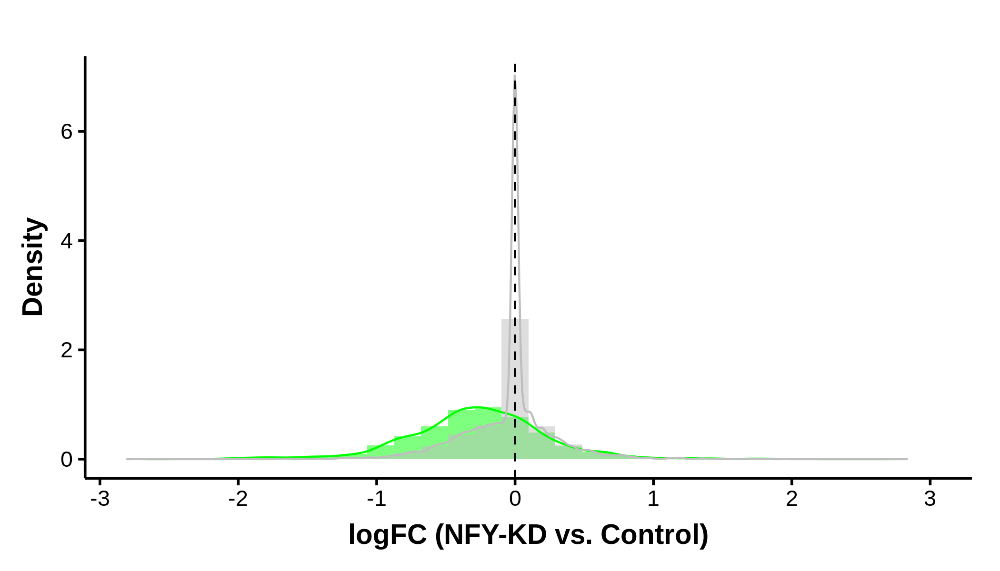

In [ ]:
%%R -i diffexp_nfy,tss_preds_nfykd_diff -w 7 -h 4 --unit in --res 300

require(ggplot2)
p=ggplot()+
 geom_histogram(aes(diffexp_nfy[rowSums(abs(tss_preds_nfykd_diff))>55],..density..),fill='green',alpha=0.5)+
 geom_histogram(aes(diffexp_nfy[rowSums(abs(tss_preds_nfykd_diff))<1],..density..),fill='gray',alpha=0.5)+
 geom_density(aes(diffexp_nfy[rowSums(abs(tss_preds_nfykd_diff))>55],..density..),color='green')+
 geom_density(aes(diffexp_nfy[rowSums(abs(tss_preds_nfykd_diff))<1],..density..),color='gray')+
 geom_vline(xintercept=0,linetype=2)+theme_Publication()+xlab('logFC (NFY-KD vs. Control)')+ylab('Density')

ggsave('./figures/experiment_nfykd.pdf', device=cairo_pdf)
p


In [ ]:
from scipy.stats import mannwhitneyu
mannwhitneyu(diffexp_yy1[np.sum(abs(tss_preds_yy1aid_diff),-1)>20], 
             diffexp_yy1[np.sum(abs(tss_preds_yy1aid_diff),-1)<1])

MannwhitneyuResult(statistic=9608011.0, pvalue=2.3049939935356037e-137)

In [ ]:
from scipy.stats import mannwhitneyu
mannwhitneyu(diffexp_nfy[np.sum(abs(tss_preds_nfykd_diff),-1)>55], 
             diffexp_nfy[np.sum(abs(tss_preds_nfykd_diff),-1)<1])

MannwhitneyuResult(statistic=7336606.0, pvalue=4.628012552058546e-136)